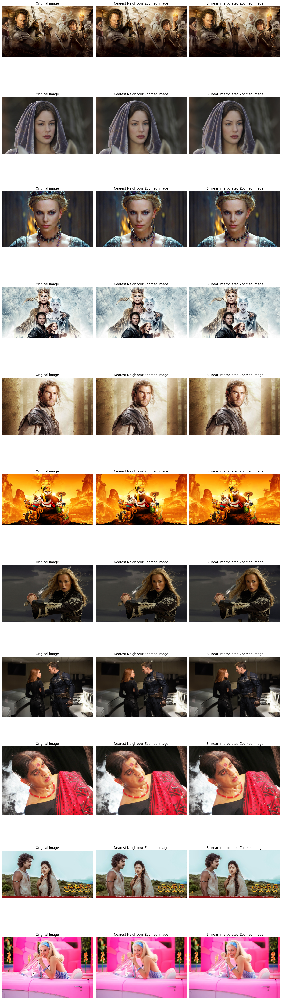

Normalized SSD for image 1 using nearest neighbour zooming: 93.85294945987654
Normalized SSD for image 1 using bilinear interpolation zooming: 93.15928385416667

Normalized SSD for image 2 using nearest neighbour zooming: 35.706039930555555
Normalized SSD for image 2 using bilinear interpolation zooming: 32.04897526041667

Normalized SSD for image 3 using nearest neighbour zooming: 51.514028729723556
Normalized SSD for image 3 using bilinear interpolation zooming: 49.46300862462874

Normalized SSD for image 4 using nearest neighbour zooming: 236.21345172646605
Normalized SSD for image 4 using bilinear interpolation zooming: 237.905145158179

Normalized SSD for image 5 using nearest neighbour zooming: 151.73173828125
Normalized SSD for image 5 using bilinear interpolation zooming: 152.36705598958332

Normalized SSD for image 6 using nearest neighbour zooming: 91.66198784722222
Normalized SSD for image 6 using bilinear interpolation zooming: 95.35593460648148

Normalized SSD for image 7 

In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import math

def zoom_nearest_neighbour(f):
  s=4
  rows, cols = f.shape[0]*s , f.shape[1]*s
  zoomed = np.zeros((rows,cols,3))
  for i in range(rows):
    for j in range(cols):
      zoomed[i][j] = f[min(f.shape[0]-1,round(i/s))][min(f.shape[1]-1,round(j/s))]
  zoomed = zoomed.astype('uint8')
  return zoomed

def zoom_bilinear_interpolation(f):
  s=4
  rows, cols = f.shape[0]*s , f.shape[1]*s

  zoomed = np.zeros((rows,cols,3))
  for i in range(rows):
    for j in range(cols):
      frac_x = i/s
      frac_y = j/s
      floor_x = math.floor(frac_x) 
      floor_y = math.floor(frac_y)
      ceil_x = math.ceil(frac_x) 
      ceil_y = math.ceil(frac_y)
      q1 = f[floor_x][floor_y]
      q2 = f[min(ceil_x,f.shape[0]-1)][floor_y]
      q3 = f[floor_x][min(ceil_y,f.shape[1]-1)]
      q4 = f[min(floor_x,f.shape[0]-1)][min(ceil_y,f.shape[1]-1)]
      r1 = q1*(frac_x - floor_x) + q2*(1 - frac_x + floor_x)
      r2 = q3*(frac_x - floor_x) + q4*(1 - frac_x + floor_x)
      r3 = r1*(frac_y - floor_y) + r2*(1 - frac_y + floor_y)

      zoomed[i,j,:] = r3
  return zoomed.astype(np.uint8)

zoomed_outs = ["../Assignment1_Images/im01small.png", "../Assignment1_Images/im02small.png", "../Assignment1_Images/im03small.png","../Assignment1_Images/im04small.png", "../Assignment1_Images/im05small.png", "../Assignment1_Images/im06small.png","../Assignment1_Images/im07small.png", "../Assignment1_Images/im08small.png", "../Assignment1_Images/im09small.png","../Assignment1_Images/im10small.png", "../Assignment1_Images/im11small.png"]
originals = ["../Assignment1_Images/im01.png", "../Assignment1_Images/im02.png", "../Assignment1_Images/im03.png","../Assignment1_Images/im04.png", "../Assignment1_Images/im05.png", "../Assignment1_Images/im06.png","../Assignment1_Images/im07.png", "../Assignment1_Images/im08.png", "../Assignment1_Images/im09.png","../Assignment1_Images/im10.png", "../Assignment1_Images/im11.png"]

fig, ax = plt.subplots(11, 3, figsize=(15, 5*11))
normalized_ssds = []

for i in range(11):
    f = cv.imread(zoomed_outs[i],cv.IMREAD_COLOR)
    g = cv.imread(originals[i],cv.IMREAD_COLOR)
    assert f is not None

    zoomed_n = zoom_nearest_neighbour(f)
    zoomed_b = zoom_bilinear_interpolation(f)

    # Resize the zoomed image to match the size of the original using interpolation
    zoomed_n1 = cv.resize(zoomed_n, (g.shape[1], g.shape[0]), interpolation=cv.INTER_NEAREST)
    zoomed_b1 = cv.resize(f, (g.shape[1], g.shape[0]), interpolation=cv.INTER_LINEAR)



    # Compute SSD for both zoomed images
    ssd_n = np.sum((g - zoomed_n1) ** 2)
    ssd_b = np.sum((g - zoomed_b1) ** 2)

    # Normalize the SSD by dividing with the total number of pixels
    total_pixels = g.shape[0] * g.shape[1]
    normalized_ssd_n = ssd_n / total_pixels
    normalized_ssd_b = ssd_b / total_pixels

    # Store the normalized SSD values
    normalized_ssds.append((normalized_ssd_n, normalized_ssd_b))

    ax[i,0].imshow(cv.cvtColor(g,cv.COLOR_BGR2RGB))
    ax[i,0].set_title('Original image')
    ax[i,0].axis('off')
    ax[i,1].imshow(cv.cvtColor(zoomed_n,cv.COLOR_BGR2RGB))
    ax[i,1].set_title('Nearest Neighbour Zoomed image')
    ax[i,1].axis('off')
    ax[i,2].imshow(cv.cvtColor(zoomed_n,cv.COLOR_BGR2RGB))
    ax[i,2].set_title('Bilinear Interpolated Zoomed image')
    ax[i,2].axis('off')


    
plt.tight_layout()
plt.savefig('Q8_all_images.png')
plt.show()

for i, (ssd_n, ssd_b) in enumerate(normalized_ssds):
    print(f"Normalized SSD for image {i+1} using nearest neighbour zooming: {ssd_n}")
    print(f"Normalized SSD for image {i+1} using bilinear interpolation zooming: {ssd_b}")
    print()

In [ ]:
import cv2
import numpy as np

# Function to perform nearest-neighbor zooming
def nearest_neighbor_zoom(image, scale_factor):
    height, width = image.shape
    new_height = int(height * scale_factor)
    new_width = int(width * scale_factor)
    zoomed_image = np.zeros((new_height, new_width), dtype=np.uint8)
    
    for i in range(new_height):
        for j in range(new_width):
            orig_i = int(i / scale_factor)
            orig_j = int(j / scale_factor)
            zoomed_image[i, j] = image[orig_i, orig_j]
    
    return zoomed_image

# Function to perform bilinear interpolation zooming
def bilinear_zoom(image, scale_factor):
    height, width = image.shape
    new_height = int(height * scale_factor)
    new_width = int(width * scale_factor)
    zoomed_image = np.zeros((new_height, new_width), dtype=np.uint8)
    
    for i in range(new_height):
        for j in range(new_width):
            orig_i = i / scale_factor
            orig_j = j / scale_factor
            floor_i = int(orig_i)
            floor_j = int(orig_j)
            ceil_i = min(floor_i + 1, height - 1)
            ceil_j = min(floor_j + 1, width - 1)
            
            alpha = orig_i - floor_i
            beta = orig_j - floor_j
            
            top_left = image[floor_i, floor_j]
            top_right = image[floor_i, ceil_j]
            bottom_left = image[ceil_i, floor_j]
            bottom_right = image[ceil_i, ceil_j]
            
            interpolated_value = (1 - alpha) * (1 - beta) * top_left + \
                                 alpha * (1 - beta) * top_right + \
                                 (1 - alpha) * beta * bottom_left + \
                                 alpha * beta * bottom_right
            
            zoomed_image[i, j] = int(interpolated_value)
    
    return zoomed_image

# Load the images
original_small = cv2.imread('../Assignment1_Images/im11.png', cv2.IMREAD_GRAYSCALE)
zoomed_out_small = cv2.imread('../Assignment1_Images/im11small.png', cv2.IMREAD_GRAYSCALE)

# Define the scale factor for zooming
scale_factor = 4

# Perform nearest-neighbor zooming
zoomed_nn = nearest_neighbor_zoom(original_small, scale_factor)
zoomed_nn_resized = cv2.resize(zoomed_nn, (250, 167))

# Perform bilinear interpolation zooming
zoomed_bilinear = bilinear_zoom(original_small, scale_factor)
zoomed_bilinear_resized = cv2.resize(zoomed_bilinear, (250, 167))  # Resize to match original_small

# Compute normalized SSD
ssd_nn = np.sum((zoomed_nn - zoomed_out_small)**2) / (original_small.shape[0] * original_small.shape[1])
ssd_bilinear = np.sum((zoomed_bilinear - zoomed_out_small)**2) / (original_small.shape[0] * original_small.shape[1])

print(f'Normalized SSD (Nearest-Neighbor): {ssd_nn:.4f}')
print(f'Normalized SSD (Bilinear): {ssd_bilinear:.4f}')

# Display the images and zoomed versions
cv2.imshow('Original Small', original_small)
cv2.imshow('Zoomed NN', zoomed_nn)
cv2.imshow('Zoomed Bilinear', zoomed_bilinear)
cv2.imshow('Zoomed Out Small', zoomed_out_small)
cv2.waitKey(0)
cv2.destroyAllWindows()

ValueError: operands could not be broadcast together with shapes (2000,3000) (167,250) 

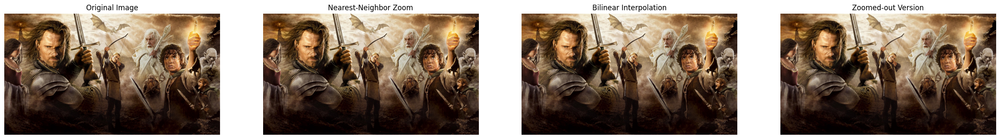

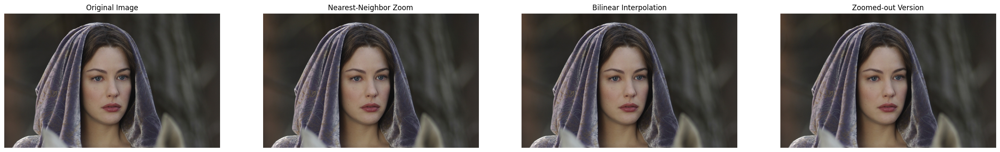

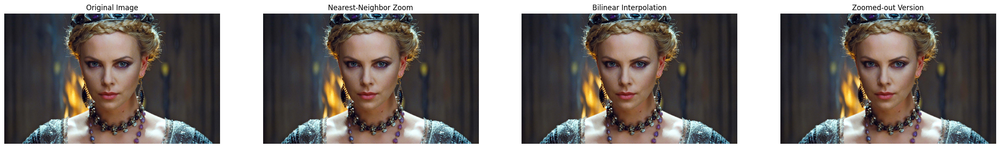

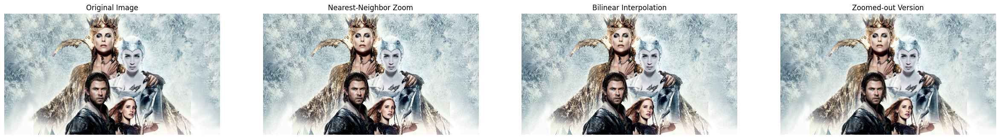

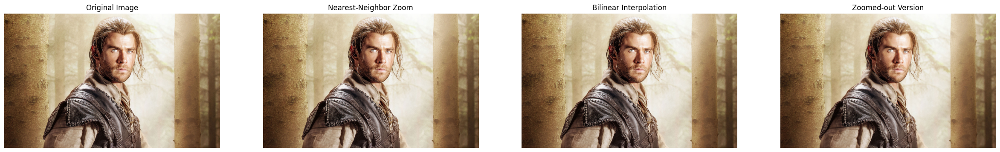

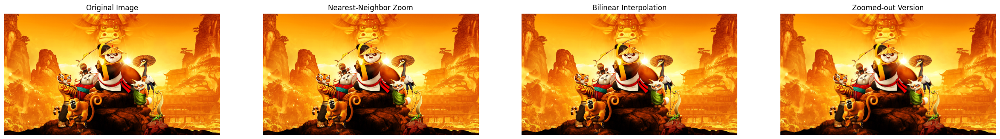

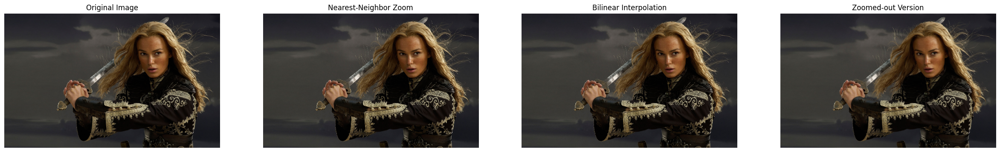

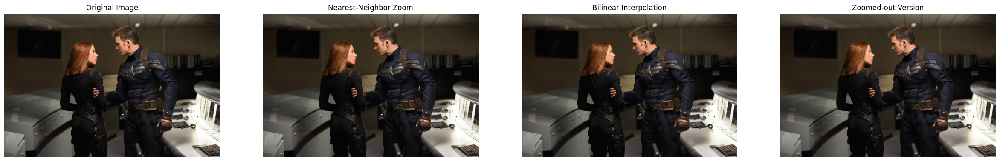

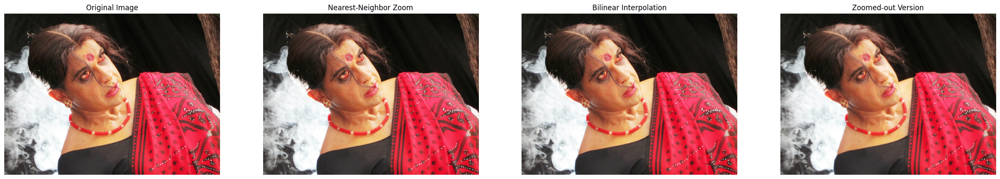

error: OpenCV(4.8.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'cv::resize'


In [11]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

zoomed_outs = ["../Assignment1_Images/im01small.png", "../Assignment1_Images/im02small.png", "../Assignment1_Images/im03small.png","../Assignment1_Images/im04small.png", "../Assignment1_Images/im05small.png", "../Assignment1_Images/im06small.png","../Assignment1_Images/im07small.png", "../Assignment1_Images/im08small.png", "../Assignment1_Images/im09small.png","../Assignment1_Images/im010small.png", "../Assignment1_Images/im011small.png"]
originals = ["../Assignment1_Images/im01.png", "../Assignment1_Images/im02.png", "../Assignment1_Images/im03.png","../Assignment1_Images/im04.png", "../Assignment1_Images/im05.png", "../Assignment1_Images/im06.png","../Assignment1_Images/im07.png", "../Assignment1_Images/im08.png", "../Assignment1_Images/im09.png","../Assignment1_Images/im010.png", "../Assignment1_Images/im011.png"]

for i in range(10):
    img = cv.imread(originals[i])
    img1 = cv.imread(zoomed_outs[i])
    near_img = cv.resize(img, None, fx=4, fy=4, interpolation=cv.INTER_NEAREST)
    bilinear_img = cv.resize(img, None, fx=4, fy=4, interpolation=cv.INTER_LINEAR)
    
    fig, ax = plt.subplots(1, 4, figsize=(30, 5))
    ax[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax[0].set_title("Original Image")
    ax[1].imshow(cv.cvtColor(near_img, cv.COLOR_BGR2RGB))
    ax[1].set_title("Nearest-Neighbor Zoom")
    ax[2].imshow(cv.cvtColor(bilinear_img, cv.COLOR_BGR2RGB))
    ax[2].set_title("Bilinear Interpolation")
    ax[3].imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
    ax[3].set_title("Zoomed-out Version")
    
    for axis in ax:
        axis.axis('off')
    
    plt.show()

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

zoomed_outs = ["../Assignment1_Images/im01small.png", "../Assignment1_Images/im02small.png", "../Assignment1_Images/im03small.png","../Assignment1_Images/im04small.png", "../Assignment1_Images/im05small.png", "../Assignment1_Images/im06small.png","../Assignment1_Images/im07small.png", "../Assignment1_Images/im08small.png", "../Assignment1_Images/im09small.png","../Assignment1_Images/im010small.png", "../Assignment1_Images/im011small.png"]
originals = ["../Assignment1_Images/im01.png", "../Assignment1_Images/im02.png", "../Assignment1_Images/im03.png","../Assignment1_Images/im04.png", "../Assignment1_Images/im05.png", "../Assignment1_Images/im06.png","../Assignment1_Images/im07.png", "../Assignment1_Images/im08.png", "../Assignment1_Images/im09.png","../Assignment1_Images/im010.png", "../Assignment1_Images/im011.png"]

for i in range(10):
    img = cv.imread(originals[i])
    img1 = cv.imread(zoomed_outs[i])
    near_img = cv.resize(img, None, fx=4, fy=4, interpolation=cv.INTER_NEAREST)
    bilinear_img = cv.resize(img, None, fx=4, fy=4, interpolation=cv.INTER_LINEAR)

    cv.imshow('Original Image', img)
    cv.waitKey(0)
    cv.destroyAllWindows()

    cv.imshow('Zoomed-out Version', img1)
    cv.waitKey(0)
    cv.destroyAllWindows()

    cv.imshow('Nearest-Neighbor Zoom', near_img)
    cv.waitKey(0)
    cv.destroyAllWindows()

    cv.imshow('Bilinear Interpolation', bilinear_img)
    cv.waitKey(0)
    cv.destroyAllWindows()


error: OpenCV(4.8.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\resize.cpp:4062: error: (-215:Assertion failed) !ssize.empty() in function 'cv::resize'


In [ ]:
f = cv.imread(r'im01small.png',cv.IMREAD_COLOR)
g = cv.imread(r'im01.png',cv.IMREAD_COLOR)
assert f is not None

zoomed = zoom_b(f)
s = np.sum((g[:,:,0:3]-zoomed[:,:,0:3])**2)/(zoomed.shape[0]*zoomed.shape[1]*zoomed.shape[2])

fig, ax = plt.subplots(1,2, figsize = (18,8))
ax[0].imshow(cv.cvtColor(zoomed,cv.COLOR_BGR2RGB))
ax[0].set_title('Zoomed in')
ax[1].imshow(cv.cvtColor(g,cv.COLOR_BGR2RGB))
ax[1].set_title('Given image')

for i in range(2):
  ax[i].axis('off')

plt.show()